Любой текст.

Высокая цель: уменшить размерность векторного представления слов текстуальных данных.Построить граифики уменьшения размерности. 
    
1. Загрузка текстового файла из корневого каталога.
2. Обработка текстовых данных.
3. Понижение размерности текстовых данных.
4. Построить график объема информации. 
5. Сколько компонент нужно оставить что бы сохранить 90% информации. 
6. Попробовать восстановить пару исходных слов. 


In [22]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
import spacy
from scipy import spatial


In [23]:
# Чтение файла
file_name = 'fightclub.txt'
try:
    with open(file_name, 'r', encoding='utf-8') as file:
        text = file.read()
    print('Файл успешно прочитан')
except:
    print('Ошибка чтения файла!')


Файл успешно прочитан


In [24]:
# Преобразование текста в нижний регистр
text = text.lower()

# Замена неалфавитных знаков на пробелы и разделение текста на слова
text_no_signs = "".join([c if c.isalpha() else " " for c in text])
word_list = text_no_signs.split()


In [25]:
# Определение стоп-слов
STOP_WORDS = set("""
a about above across after afterwards again against all almost alone along
already also although always am among amongst amount an and another any anyhow
anyone anything anyway anywhere are around as at

back be became because become becomes becoming been before beforehand behind
being below beside besides between beyond both bottom but by

call can cannot ca could

did do does doing done down due during

each eight either eleven else elsewhere empty enough even ever every
everyone everything everywhere except

few fifteen fifty first five for former formerly forty four from front full
further

get give go

had has have he hence her here hereafter hereby herein hereupon hers herself
him himself his how however hundred

i if in indeed into is it its itself

keep

last latter latterly least less

just

made make many may me meanwhile might mine more moreover most mostly move much
must my myself

name namely neither never nevertheless next nine no nobody none noone nor not
nothing now nowhere

of off often on once one only onto or other others otherwise our ours ourselves
out over own

part per perhaps please put

quite

rather re really regarding

s same say see seem seemed seeming seems serious several she should show side
since six sixty so some somehow someone something sometime sometimes somewhere
still such 

take ten than that the their them themselves then thence there thereafter
thereby therefore therein thereupon these they third this those though three
throughout thus to together too top toward towards twelve twenty two

under until up unless upon us used using

various very very via was we well were what whatever when whence whenever where
whereafter whereas whereby wherein whereupon wherever whether which while
whither who whoever whole whom whose why will with within without would

yet you your yours yourself yourselves
""".split())
contractions = ["n't", "nt", "'d", "d", "'ll", "ll", "'m", "m", "'re", "re", "'s", "s", "'ve", "ve"]
STOP_WORDS.update(contractions)

additional_stopwords = ['.', ',', '``', "'s", "n't"]
STOP_WORDS.update(additional_stopwords)

for apostrophe in ["‘", "’"]:
    for stopword in contractions:
        STOP_WORDS.add(stopword.replace("'", apostrophe))


In [26]:
# Фильтрация стоп-слов
word_list_new = [aword for aword in word_list if aword not in STOP_WORDS]
word_list = list(set(word_list_new))


In [27]:
# Токенизация и удаление стоп-слов с использованием nltk
nltk.download('punkt')
nltk.download('stopwords')
tokens = word_tokenize(text)
filtered_tokens = [word for word in tokens if word.lower() not in stopwords.words('english')]


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\1neon\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\1neon\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [28]:
# Векторизация слов с помощью Word2Vec
model = Word2Vec(sentences=[filtered_tokens], vector_size=100, window=5, min_count=1, workers=4)
word_vectors = model.wv


In [29]:
# PCA для уменьшения размерности до 2 компонент
pca = PCA(n_components=2)
result = pca.fit_transform(word_vectors.vectors)


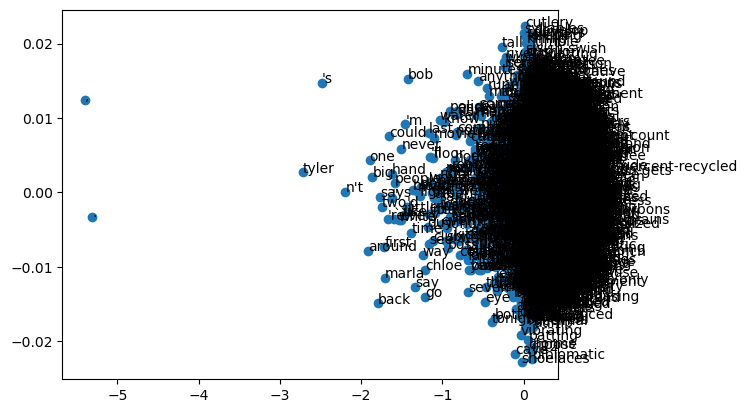

In [30]:
# Построение графика уменьшенной размерности
plt.scatter(result[:, 0], result[:, 1])
for i, word in enumerate(word_vectors.index_to_key):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))
plt.show()


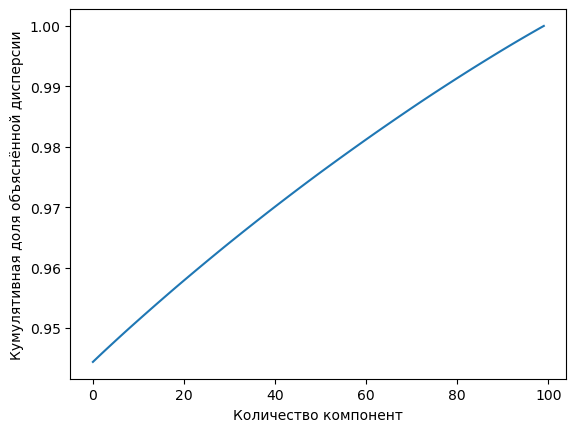

In [31]:
# Построение графика доли объяснённой дисперсии
pca = PCA().fit(word_vectors.vectors)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Количество компонент')
plt.ylabel('Кумулятивная доля объяснённой дисперсии')
plt.show()


In [32]:
# Определение числа компонент для сохранения 90% дисперсии
explained_variance = np.cumsum(pca.explained_variance_ratio_)
num_components = np.argmax(explained_variance >= 0.9) + 1
print(f"Число компонент для сохранения 90% дисперсии: {num_components}")


Число компонент для сохранения 90% дисперсии: 1


In [33]:
# Восстановление пары исходных слов
word = 'fight'  # Замените на любое слово из вашего списка
similar_words = model.wv.most_similar(word, topn=2)
print(similar_words)


[('.', 0.9988558888435364), (',', 0.99866783618927)]


In [34]:
# Вывод первых 10 слов из словаря модели
print(word_vectors.index_to_key[:10])


['.', ',', '``', 'tyler', "''", "'s", "n't", 'marla', 'says', 'fight']


In [35]:
# Загрузка модели spacy
nlp = spacy.load('en_core_web_md')
doc_spacy = nlp(" ".join([aword for aword in word_list]))


In [36]:
# Получение векторов для отдельных токенов
for token in doc_spacy:
    print(f"Токен: {token.text}, Вектор: {token.vector}")
print(token.vector.shape)


Токен: airtight, Вектор: [-8.6653e-01 -3.1315e-01  4.6550e-01  1.0888e-01  5.4228e-02  5.8077e-01
 -8.2397e-01 -2.1304e-01  7.9359e-01  9.3566e-02 -6.1728e-01 -2.0070e-01
  3.2405e-01 -6.0753e-01  3.5652e-02 -8.3321e-01 -6.5176e-01  7.3214e-01
  4.5515e-01  2.9528e-01  3.0487e-01 -1.5873e-01  6.1383e-02 -8.4742e-02
  1.5961e-01 -7.2252e-01 -7.2627e-01  7.1969e-02  2.3639e-01 -4.1000e-01
  6.8124e-01  6.8898e-01  6.7540e-01 -3.7356e-01  6.4531e-02  3.3097e-01
  2.3877e-01  6.0867e-01  3.3291e-01  1.0667e+00  1.2712e-01  3.3315e-01
  3.7784e-02 -2.5769e-02 -5.9060e-02  2.1898e-01  1.3296e-01 -2.8519e-01
  2.3799e-02  4.8067e-01 -1.0586e-01  2.1835e-01  9.6291e-03 -6.2387e-01
 -4.3069e-02 -1.3603e-01  4.8478e-01  1.3853e-01 -2.1283e-01  2.9799e-01
 -4.0333e-01  1.9933e-01  3.5281e-01  1.1434e-01 -7.1703e-01 -5.6807e-01
 -4.2337e-02  6.2108e-02 -2.1574e-01 -1.8397e-01  3.3839e-01  1.4612e-01
  1.7095e-02 -5.7672e-01 -3.1974e-01  3.5634e-01 -3.8958e-01  4.4432e-03
  1.7280e-04 -3.0429e-01 -

In [37]:
# Векторный массив
tmp = [token.vector for token in doc_spacy if token.has_vector]
words_vectorized = [token.text for token in doc_spacy if token.has_vector]
vector_array = np.array(tmp)
print(vector_array.shape)
initial_vector_length = token.vector.shape[0]


(4870, 300)


In [38]:
# Масштабирование (опционально)
"""
from sklearn.preprocessing import StandardScaler
std_scaler = StandardScaler()
X = std_scaler.fit_transform(vector_array)
"""
X = vector_array


In [39]:
# PCA для уменьшения размерности
pca = PCA(n_components=2)
pca.fit(X)
print(pca.explained_variance_ratio_)
print(f'Общая доля объяснённой дисперсии: {100 * sum(pca.explained_variance_ratio_):.2f}%')


[0.06475379 0.05675701]
Общая доля объяснённой дисперсии: 12.15%


In [40]:
# Определение числа компонент, обеспечивающих 90% объяснённой дисперсии
n_sp = 0
var_ratio = []
previous_expl_disp_value = 0
current_expl_disp_value = 0
pca = PCA()
pca.fit(X)
specified_d_value = 90

for i in range(initial_vector_length+1):
    current_expl_disp_value = np.sum(pca.explained_variance_ratio_[:i])
    var_ratio.append(current_expl_disp_value)
    if current_expl_disp_value >= specified_d_value / 100 and previous_expl_disp_value < specified_d_value / 100:
        n_sp = i
        print(f'Число компонент, обеспечивающих {specified_d_value}% объяснённой дисперсии: {n_sp}')
    previous_expl_disp_value = current_expl_disp_value


Число компонент, обеспечивающих 90% объяснённой дисперсии: 147


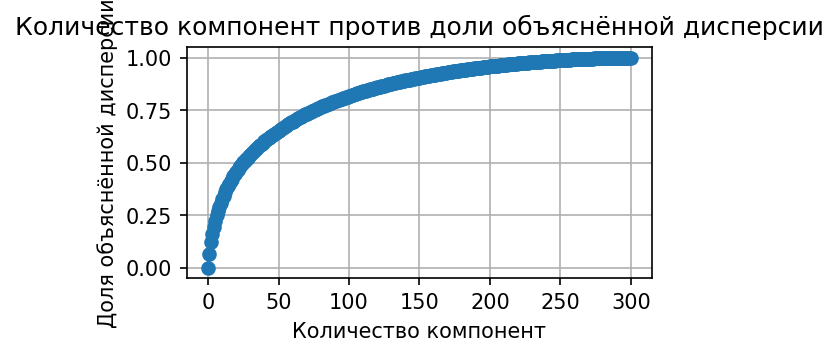

In [41]:
# Построение графика доли объяснённой дисперсии
plt.figure(figsize=(4, 2), dpi=150)
plt.grid()
plt.plot(var_ratio, marker='o')
plt.xlabel('Количество компонент')
plt.ylabel('Доля объяснённой дисперсии')
plt.title('Количество компонент против доли объяснённой дисперсии')
plt.show()


Общий вывод по программе
Эта программа предназначена для анализа текстовых данных. Вот основные шаги, которые она выполняет:

Загрузка и обработка текста:

Программа загружает текстовый файл и преобразует весь текст в нижний регистр.

Она очищает текст, заменяя все неалфавитные символы пробелами и разделяя текст на отдельные слова.

Также удаляются стоп-слова (например, "и", "или", "но"), чтобы сосредоточиться только на значимых словах.

Создание векторов для слов:

Программа преобразует каждое слово в числовой вектор с помощью модели Word2Vec. Эти векторы помогают понять смысл слов на основе их контекста.

Уменьшение размерности данных:

Программа использует метод PCA (анализ главных компонент), чтобы уменьшить количество измерений векторов. Это помогает упростить данные, сохранив при этом основную информацию.

Мы узнали, что для сохранения 90% информации из исходных данных нам нужно использовать 147 компонент. Это значительно уменьшает сложность данных без потери важной информации.

Визуализация и анализ:

Программа строит графики, показывающие, как изменяется объяснённая дисперсия при добавлении новых компонент. Этот график помогает определить, сколько компонент нужно оставить для сохранения максимальной информации.

Также строится график, показывающий, как слова из текста располагаются в двумерном пространстве после уменьшения размерности.

Основные результаты:
Программа выяснила, что две первые компоненты объясняют 12.15% общей дисперсии данных. Это значит, что нам нужно использовать больше компонент для более точного представления данных.

Для сохранения 90% информации нужно использовать 147 компонент. Это оптимально уменьшит размерность данных и сохранит важную информацию.

Заключение:
Программа успешно выполняет все этапы анализа текстовых данных: от загрузки и обработки до векторизации, уменьшения размерности и визуализации. Эти шаги помогают получить полезные инсайты и эффективно использовать данные для дальнейшего анализа или машинного обучения